In [ ]:
from moire.lattice import Lattice, Bilayer, Supercell
import numpy as np

In [ ]:
m, n = 2, 1
Δz = 2
my_lat = Lattice(2.45951214)
C_dic = dict(name='C', color='blue', key='1A', draw_radius=50,pseudo_potential='C.pbe-n-kjpaw_psl.1.0.0.UPF', weight=12.0107)
my_lat.set_atom(np.array((0, 0, 0)), C_dic)
C_dic['color'] = 'lightblue'
C_dic['key'] = '1B'
my_lat.set_atom(np.array([0, 1.42, 0]), C_dic)
layer_1 = Supercell(my_lat, m , n)
C_dic['color'] = 'red'
C_dic['key'] = '2A'
lattice_2 = Lattice(2.45951214)
lattice_2.set_atom(np.array([0, 0, Δz]), C_dic)
C_dic['color'] = 'firebrick'
C_dic['key'] = '2B'
lattice_2.set_atom(np.array([0, 1.42, Δz]), C_dic)
layer_2 = Supercell(lattice_2, n, m)
my_lattice = Bilayer(layer_1, layer_2)


In [ ]:
my_lattice.plot(3, 1.5, D=2, plot_3d=True, all=dict(showlegend=True))

In [ ]:
from moire.dft import DFT
qe_dic = {
            '&CONTROL': {
                'pseudo_dir': '/home/hidde/hidde/Unige/dft/pseudo/'
            },
            '&SYSTEM': {
                'occupations': 'smearing',
                'smearing': 'mv',
                'degauss': 0.015,  
                'ecutwfc': 45,
                'ecutrho': 180,
                'nbnd': 30
            }
        }

data_dir = '/home/hidde/hidde/Unige/dft/graphene2'
graphene = DFT('graphene', data_dir, data_dir)
graphene.prepare_qe(qe_dic)
graphene.import_lattice(my_lat)
graphene.set_k_grid(8)
graphene.set_k_path([(0, 0, 0), (0.5, 0, 0), (1/3, 1/3, 0), (0, 0, 0)], ["Γ", "M", "K", "Γ"], 100)

In [ ]:
graphene.extract_nscf()

In [ ]:
graphene.plot_nscf()
graphene.band_plot.fig

In [ ]:
graphene.write_qe('nscf')

In [ ]:
graphene.run_qe('nscf')

In [ ]:
from moire.dft import DFT
data_dir = '/home/hidde/hidde/Unige/dft/twb21'
tb = DFT('tbwse2_21', data_dir, data_dir)
qe_dic = {}
tb.prepare_qe(qe_dic)
tb.set_k_path([(0, 0, 0), (0.5, 0, 0), (1/3, 1/3, 0), (0, 0, 0)], ["Γ", "M", "K", "Γ"], 100)
tb.extract_nscf()
tb.plot_nscf()
tb.band_plot.fig


In [ ]:
32032/81

In [ ]:
print(*a)

In [ ]:
2.95+3.6+2.7+3.9+5.9+1+0.95+2.9+2.95+0.25+3.9+2.95+3.6

In [ ]:
5.65+7.95

In [ ]:
3.5/2 + 5.2+1.8+2+1.35+0.9

In [ ]:
import numpy as np
a = np.array([[0, 1], [1, 2]])
np.tile(a, (3, 3))

In [ ]:
type([])

In [ ]:
plop = dict(hoi=4, boi=4)
print(plop)

print(keys)
for key in keys:
    print(key)
    plop['pop/'+key] = plop.pop(key)

plop

In [ ]:
nscf_data = np.tile(np.load(self.prefix+'/qe_nscf.npy'), (3, 3, 1))
x = np.linspace(-1, 2, len(nscf_data))
bands = np.zeros((len(self.band_plot.k_path), nscf_data.shape[2]))
k_x, k_y, k_z = np.transpose(self.band_plot.k_path)
for i in range(nscf_data.shape[2]):
    f_interpolation = RectBivariateSpline(x, x, nscf_data[:, :, i])
    bands[:, i] = f_interpolation(k_x, k_y, grid=False)

In [ ]:
def f(**kwargs):
    if 'hoi' in kwargs:
        kwargs.pop('hoi')
    return kwargs

f(hoi=3, bop=2)

In [ ]:
f(**{'hoi': 1})

In [ ]:
len(1)

In [ ]:
for i in range(3):
    a = 4
print(a)

In [ ]:
import plotly.graph_objects as go
import numpy as np

# Create figure
fig = go.Figure()

# Add traces, one for each slider step
for step in np.arange(0, 5, 0.1):
    fig.add_trace(
        go.Scatter(
            visible=False,
            line=dict(color="#00CED1", width=6),
            name="𝜈 = " + str(step),
            x=np.arange(0, 10, 0.01),
            y=np.sin(step * np.arange(0, 10, 0.01))))

# Make 10th trace visible
fig.data[10].visible = True

# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "Slider switched to step: " + str(i)}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "Frequency: "},
    pad={"t": 50},
    steps=steps,
    y=0
)]

fig.update_layout(
    sliders=sliders
)

fig.show()

In [26]:
from moire.dft import plot
import numpy as np
import plotly.graph_objects as go

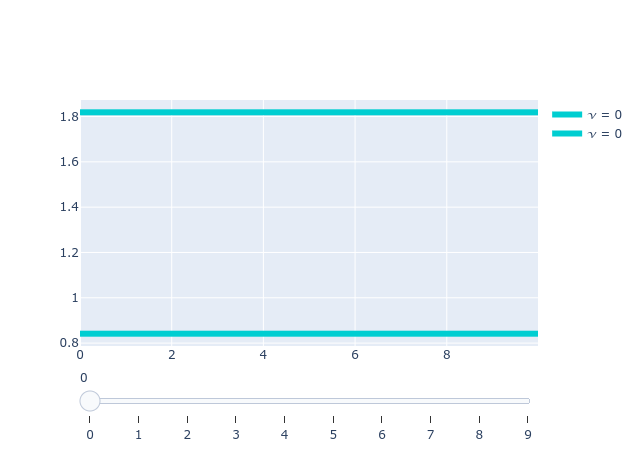

In [36]:
def my_plot(func):
    decorators = [plot.slider, plot.legend]
    for decorator in reversed(decorators):
        func = decorator(func)
    return func
    
@my_plot
def f(step=1, scale=1, **kwargs):
    return go.Scatter(
            visible=False,
            line=dict(color="#00CED1", width=6),
            name="𝜈 = " + str(step),
            x=np.arange(0, 10, 0.01),
            y=scale*np.sin(scale+step * np.arange(0, 10, 0.01)))

traces = f(slider=dict(args=dict(step=range(10))), legend=dict(args=dict(scale=[1, 2])))
traces


In [ ]:
def f(step=1, **kwargs):
    return go.Scatter(
            visible=False,
            line=dict(color="#00CED1", width=6),
            name="𝜈 = " + str(step),
            x=np.arange(0, 10, 0.01),
            y=np.sin(step * np.arange(0, 10, 0.01)))
step = 1
fig = go.Figure(data=go.Scatter(
            visible=False,
            line=dict(color="#00CED1", width=6),
            name="𝜈 = " + str(step),
            x=np.arange(0, 10, 0.01),
            y=np.sin(step * np.arange(0, 10, 0.01))))
fig.show()

In [ ]:
import numpy as np
np.sign(-1) * np.sign(1) >= 0

In [ ]:
def m_l(j, m_j):
    return int(m_j - np.sign((j-2)*m_j) / 2)

m_l(1.5, -1.5)

In [ ]:
-0 == 0

In [ ]:
from scipy.interpolate import griddata

points = ((0, 0), (1, 0), (1, 1), (0, 1))
values = np.array(((0, 1), (0, 2), (1, 1), (1, 2)))
for value in values:
    f_inter = RectBivariateSpline([0, 1], [0 1], values) 

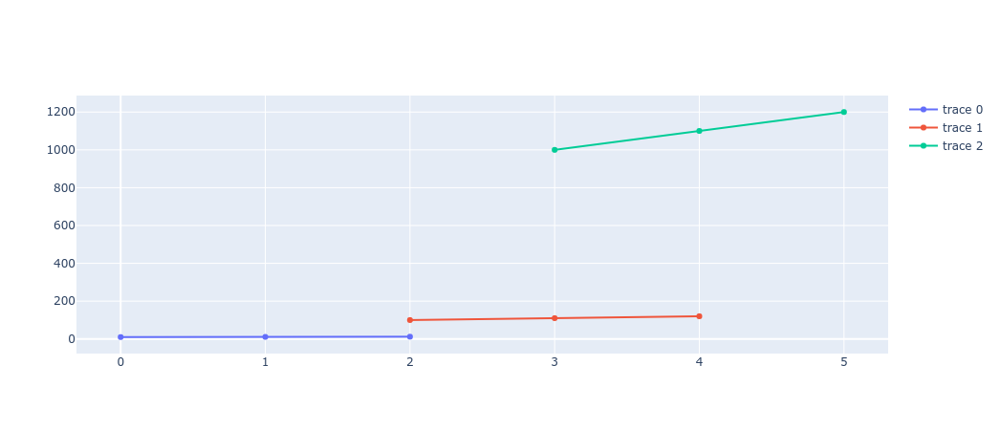

In [5]:
import plotly.graph_objects as go

trace1 = go.Scatter(
    x=[0, 1, 2],
    y=[10, 11, 12]
)
trace2 = go.Scatter(
    x=[2, 3, 4],
    y=[100, 110, 120]
)
trace3 = go.Scatter(
    x=[3, 4, 5],
    y=[1000, 1100, 1200]
)
data = [trace1, trace2, trace3]
fig = go.Figure(data=data)
fig.show()

In [ ]:
import numpy as np
fig = go.Figure()
fig.add_traces(go.Scatter(y=np.array([1, 2])))
fig.add_trace(go.Scatter(x=[0.5, 0.7], y=[1, 2], mode='markers', marker=dict(color='green')))
fig

In [ ]:
for i in np.array([[1, 2, 3], [1, 1, 2]]):
    print(i)

In [ ]:
a = 'a a a a'
a.replace(' ', '')

In [1]:
from moire.dft import DFT
data_dir = '/home/hidde/hidde/Unige/dft/tbwse2'
tb = DFT('tbwse2_21', data_dir, data_dir)
qe_dic = {}
#tb.extract_projwfc()


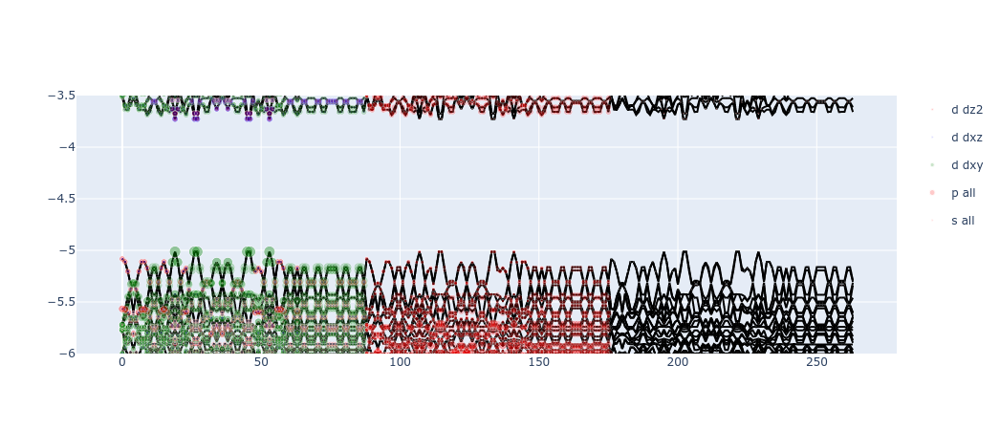

In [5]:
fig, total_dens = tb.plot_wfc([-6, -3.5])
fig

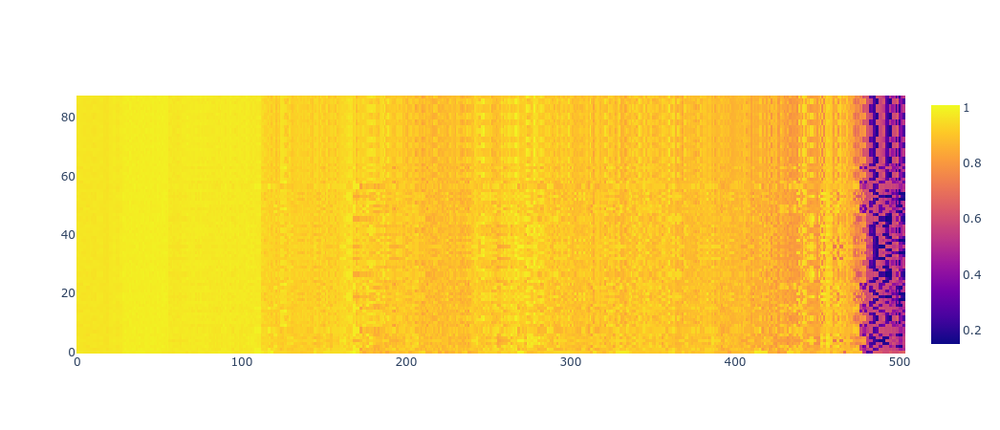

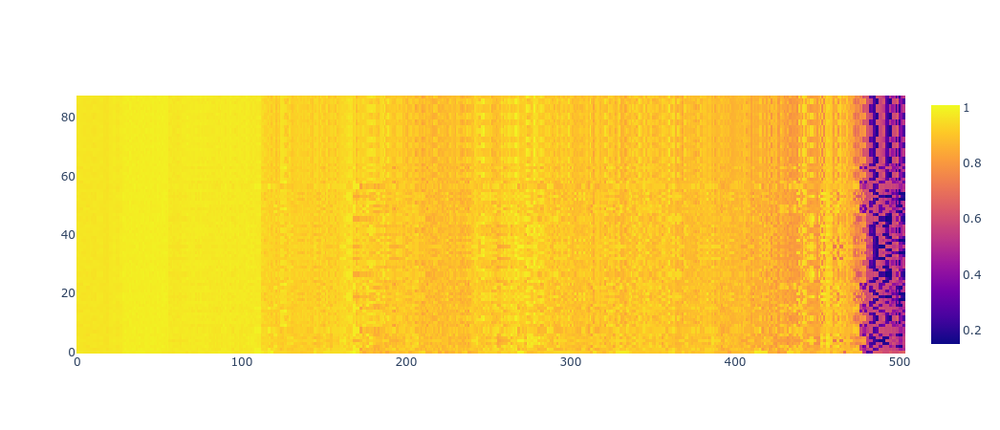

In [3]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Heatmap(
                    z=total_dens))
fig.show()

In [6]:
 import numpy as np
 i = 1
 psi = np.array([0.114, 0.114, 0.114, 0.114, 0.114, 0.114, 0.071, 0.071, 0.025, 0.025, 0.025, 0.025, 0.025, 0.025])

In [8]:
np.sum(psi**2)

0.091808

In [9]:
psi = """0.015*[#  22]+0.015*[#  25]+0.015*[#  48]+0.015*[#  51]+0.015*[#  74]
          +0.015*[#  77]+0.015*[# 100]+0.015*[# 103]+0.015*[# 126]+0.015*[# 129]
          +0.015*[# 152]+0.015*[# 155]+0.015*[# 178]+0.015*[# 181]+0.010*[#  96]
          +0.010*[#  97]+0.009*[#  17]+0.009*[#  20]+0.009*[#  43]+0.009*[#  46]
          +0.009*[#  69]+0.009*[#  72]+0.009*[#  95]+0.009*[#  98]+0.009*[# 121]
          +0.009*[# 124]+0.009*[# 147]+0.009*[# 150]+0.009*[# 173]+0.009*[# 176]
          +0.009*[# 122]+0.009*[# 123]+0.009*[# 148]+0.009*[# 149]+0.009*[# 174]
          +0.009*[# 175]+0.008*[#  18]+0.008*[#  19]+0.008*[#  44]+0.008*[#  45]
          +0.008*[#  70]+0.008*[#  71]+0.008*[# 463]+0.008*[# 464]+0.008*[# 391]
          +0.008*[# 392]+0.008*[# 399]+0.008*[# 400]+0.008*[# 407]+0.008*[# 408]
          +0.008*[# 415]+0.008*[# 416]+0.008*[# 423]+0.008*[# 424]+0.008*[# 431]
          +0.008*[# 432]+0.008*[# 439]+0.008*[# 440]+0.007*[# 367]+0.007*[# 368]
          +0.007*[# 375]+0.007*[# 376]+0.007*[# 383]+0.007*[# 384]+0.007*[# 447]
          +0.007*[# 448]+0.007*[# 455]+0.007*[# 456]+0.007*[# 471]+0.007*[# 472]
          +0.006*[# 410]+0.006*[# 411]+0.005*[# 466]+0.005*[# 467]+0.005*[# 450]
          +0.005*[# 451]+0.005*[# 458]+0.005*[# 459]+0.005*[# 474]+0.005*[# 475]
          +0.005*[# 394]+0.005*[# 395]+0.005*[# 402]+0.005*[# 403]+0.005*[# 418]
          +0.005*[# 419]+0.005*[# 409]+0.005*[# 412]+0.005*[# 465]+0.005*[# 468]
          +0.004*[# 370]+0.004*[# 371]+0.004*[# 378]+0.004*[# 379]+0.004*[# 386]
          +0.004*[# 387]+0.004*[# 434]+0.004*[# 101]+0.004*[# 102]+0.004*[# 369]
          +0.004*[# 372]+0.004*[# 377]+0.004*[# 380]+0.004*[# 385]+0.004*[# 388]
          +0.004*[# 426]+0.004*[# 427]+0.004*[# 435]+0.004*[# 442]+0.004*[# 443]
          +0.004*[# 393]+0.004*[# 396]+0.004*[# 401]+0.004*[# 404]+0.004*[# 417]
          +0.004*[# 420]+0.004*[# 449]+0.004*[# 452]+0.004*[# 457]+0.004*[# 460]
          +0.004*[# 473]+0.004*[# 476]+0.003*[# 425]+0.003*[# 428]+0.003*[# 433]
          +0.003*[# 436]+0.003*[# 441]+0.003*[# 444]+0.003*[#  23]+0.003*[#  24]
          +0.003*[#  49]+0.003*[#  50]+0.003*[#  75]+0.003*[#  76]+0.003*[# 127]
          +0.003*[# 128]+0.003*[# 153]+0.003*[# 154]+0.003*[# 179]+0.003*[# 180]"""

In [15]:
ψ = np.array([float(elem.split('*')[0]) for elem in psi.split('+')])
np.sum(ψghbhbgf)

0.9540000000000002

In [24]:
with open('/mnt/c/Users/hidde/Downloads/wfc', errors='ignore') as f:
    first_line = f.readline()

In [33]:
from scipy.io import FortranFile
num = 0
with open("/mnt/c/Users/hidde/Downloads/wfc", errors='ignore', encoding='latin-1') as fileobject:
    for line in fileobject:
        num += 1
        print(line)
        if num == 5:
            break

,                                           ð?,      /  /     ø     H   

k0Ø?<ú3ucîË?               9ú3ucîÛ?                       [h±Ûnº?H   4^                     ÿÿÿÿ                   þÿÿÿ                   ýÿÿÿ                   üÿÿÿ           ÿÿÿÿ        ÿÿÿÿ           ÿÿÿÿ                  ÿÿÿÿ               ÿÿÿÿ    ÿÿÿÿÿÿÿÿ       ÿÿÿÿ   ÿÿÿÿÿÿÿÿ          ÿÿÿÿÿÿÿÿ    ÿÿÿÿ          ÿÿÿÿ             ÿÿÿÿÿÿÿÿ   ÿÿÿÿ          ÿÿÿÿ          ÿÿÿÿ    þÿÿÿÿÿÿÿ       ÿÿÿÿ   þÿÿÿÿÿÿÿ          ÿÿÿÿþÿÿÿ    ÿÿÿÿ          þÿÿÿ             ÿÿÿÿþÿÿÿ   ÿÿÿÿ          þÿÿÿ                  ûÿÿÿ           ÿÿÿÿ    ýÿÿÿÿÿÿÿ       ÿÿÿÿ   ýÿÿÿÿÿÿÿ          ÿÿÿÿýÿÿÿ    ÿÿÿÿ          ýÿÿÿ             ÿÿÿÿýÿÿÿ   ÿÿÿÿ          ýÿÿÿ          ÿÿÿÿ    üÿÿÿÿÿÿÿ       ÿÿÿÿ   üÿÿÿÿÿÿÿ          ÿÿÿÿüÿÿÿ    ÿÿÿÿ          üÿÿÿ             ÿÿÿÿüÿÿÿ   ÿÿÿÿ          üÿÿÿ                  úÿÿÿ           ÿÿÿÿ    ûÿÿÿÿÿÿÿ       ÿÿÿÿ   ûÿÿÿÿ

In [37]:
from scipy.io import FortranFile
import numpy as np
f = FortranFile("/mnt/c/Users/hidde/Downloads/wfc", 'r')
with f:
    print(f.read_reals(float))

ValueError: Size obtained (44) is not a multiple of the dtypes given (8).

In [39]:
import h5py
with h5py.File("/mnt/c/Users/hidde/Downloads/wfc", 'r') as f:
    for name in f:
        print(name)


OSError: Unable to open file (file signature not found)

In [5]:
import numpy as np
(1.0545718 * 10**-34)**2*(2*np.pi*10**10/3.3**2)**2/(2*9.1 * 10**-31)*6.242*10**18

1.2697220486795255

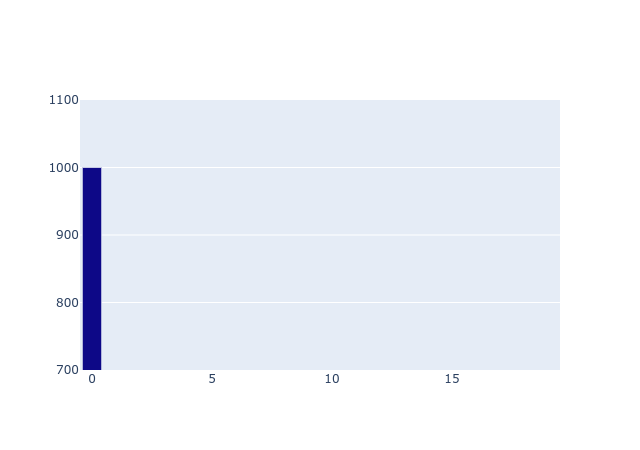

In [1]:
import plotly.graph_objects as go
import plotly.express as px
import numpy as np
from plotly.subplots import make_subplots

y=np.arange(20)
y[0]=1000

color = px.colors.sequential.Plasma[0]
cut_interval = [30, 700]
bar = go.Bar(
    y=y, name='foo',
    marker_color=color,
    legendgroup='foo',
)
fig = make_subplots(
    rows=1, cols=1, 
    vertical_spacing = 0.05, 
    shared_xaxes=True,
)

fig.append_trace(bar, row=1, col=1)
#bar.showlegend=False
#fig.append_trace(bar, row=2, col=1)

fig.update_yaxes(range=[cut_interval[1], np.max(y)*1.1], row=1, col=1)
#fig.update_xaxes(visible=False, row=1, col=1)
#fig.update_yaxes(range=[0, cut_interval[0]], row=2, col=1)

In [32]:
def f(j, m_j):
    m_l = int(m_j - np.sign((j-2)*m_j) / 2)
    m_s = np.sign(j-2)*np.sign(m_j)/2
    return m_l, m_s

In [38]:
f(1.5, -0.5)

(-1, 0.5)

In [52]:
def f(l, j, m_j):
    m_l = (m_j - np.sign((j-l)*m_j) / 2)
    m_s = np.sign(j-l)*np.sign(m_j)/2
    return m_l, m_s

In [54]:
f(2, 1.5, 0.5)

(1.0, -0.5)

In [13]:
import numpy as np

a = np.random.rand(9, 9)

In [4]:
a

array([[0.15962673, 0.2509627 , 0.94909117],
       [0.06176788, 0.11874887, 0.00556813],
       [0.52817114, 0.66563893, 0.06988067]])

In [14]:
a.sort(axis=0)

In [9]:
a = a.T

In [15]:
a

array([[0.11580739, 0.16544261, 0.12383715, 0.01334811, 0.21981724,
        0.13694314, 0.03418991, 0.25548792, 0.02714825],
       [0.21446003, 0.40622705, 0.25956606, 0.03192643, 0.28012747,
        0.18592973, 0.26938857, 0.26894389, 0.118992  ],
       [0.26063325, 0.49721883, 0.3386958 , 0.09520714, 0.32408636,
        0.25727499, 0.29847932, 0.41030756, 0.335908  ],
       [0.39445964, 0.53624478, 0.42319901, 0.10084373, 0.54203673,
        0.37194766, 0.43841821, 0.47904582, 0.4401004 ],
       [0.40587283, 0.55421606, 0.43345142, 0.57849655, 0.63584642,
        0.54369985, 0.54604604, 0.75454486, 0.64669595],
       [0.53434281, 0.64452455, 0.52187633, 0.61948945, 0.64098165,
        0.56278805, 0.6012849 , 0.76924288, 0.70831971],
       [0.74608785, 0.79464678, 0.56088622, 0.71423002, 0.6911648 ,
        0.69747952, 0.82811542, 0.78739306, 0.81020312],
       [0.89089101, 0.83657329, 0.58489397, 0.71657883, 0.82019551,
        0.70114701, 0.85786618, 0.87384282, 0.96756528],


In [16]:
a < 0.5

array([[ True,  True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True,  True],
       [ True, False,  True,  True, False,  True,  True,  True,  True],
       [ True, False,  True, False, False, False, False, False, False],
       [False, False, False, False, False, False, False, False, False],
       [False, False, False, False, False, False, False, False, False],
       [False, False, False, False, False, False, False, False, False],
       [False, False, False, False, False, False, False, False, False]])

In [19]:
np.max(np.sum(a>0.5, axis=0))

6

In [20]:
b = (a*(a<0.5))[:5, :]
c = (a*(a>0.5))[3:, :]

In [21]:
b

array([[0.11580739, 0.16544261, 0.12383715, 0.01334811, 0.21981724,
        0.13694314, 0.03418991, 0.25548792, 0.02714825],
       [0.21446003, 0.40622705, 0.25956606, 0.03192643, 0.28012747,
        0.18592973, 0.26938857, 0.26894389, 0.118992  ],
       [0.26063325, 0.49721883, 0.3386958 , 0.09520714, 0.32408636,
        0.25727499, 0.29847932, 0.41030756, 0.335908  ],
       [0.39445964, 0.        , 0.42319901, 0.10084373, 0.        ,
        0.37194766, 0.43841821, 0.47904582, 0.4401004 ],
       [0.40587283, 0.        , 0.43345142, 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ]])

In [22]:
c

array([[0.        , 0.53624478, 0.        , 0.        , 0.54203673,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.55421606, 0.        , 0.57849655, 0.63584642,
        0.54369985, 0.54604604, 0.75454486, 0.64669595],
       [0.53434281, 0.64452455, 0.52187633, 0.61948945, 0.64098165,
        0.56278805, 0.6012849 , 0.76924288, 0.70831971],
       [0.74608785, 0.79464678, 0.56088622, 0.71423002, 0.6911648 ,
        0.69747952, 0.82811542, 0.78739306, 0.81020312],
       [0.89089101, 0.83657329, 0.58489397, 0.71657883, 0.82019551,
        0.70114701, 0.85786618, 0.87384282, 0.96756528],
       [0.95922339, 0.9942223 , 0.82286583, 0.81105635, 0.82997123,
        0.84445439, 0.9756671 , 0.95767073, 0.98383026]])

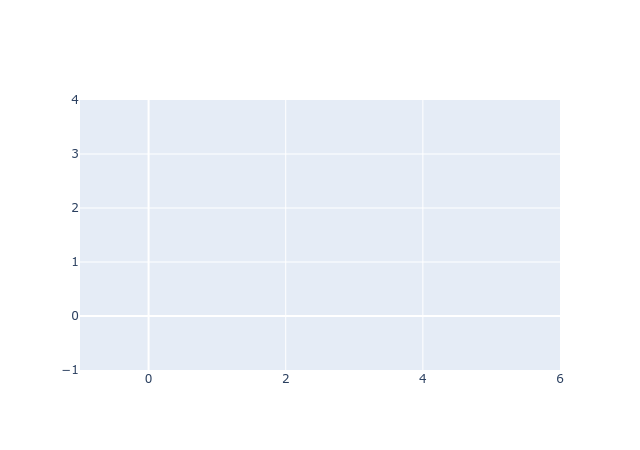

In [37]:
make_subplots(
    rows=1, 
    cols=1, 
    vertical_spacing = 0.05, 
    shared_xaxes=True
)

In [2]:
import plotly.graph_objects as go
import plotly.express as px
import numpy as np
from plotly.subplots import make_subplots
from moire.decorators import my_plot, slider

@slider
def lattice(V=0):
    H = lambda k: np.linalg.eigvalsh([[V, np.cos(k)], [np.cos(k), -V]])
    bands = np.array([H(k) for k in np.linspace(-np.pi, np.pi, 100)]).T
    return [go.Scatter(y=band) for band in bands]

lattice(V=2)

ValueError: 
    Invalid element(s) received for the 'data' property of 
        Invalid elements include: [[Scatter({
    'y': array([-2.23606798,  2.23606798])
}), Scatter({
    'y': array([-2.23516832,  2.23516832])
}), Scatter({
    'y': array([-2.23248166,  2.23248166])
}), Scatter({
    'y': array([-2.22804488,  2.22804488])
}), Scatter({
    'y': array([-2.22191915,  2.22191915])
}), Scatter({
    'y': array([-2.2141895,  2.2141895])
}), Scatter({
    'y': array([-2.20496418,  2.20496418])
}), Scatter({
    'y': array([-2.19437379,  2.19437379])
}), Scatter({
    'y': array([-2.18257021,  2.18257021])
}), Scatter({
    'y': array([-2.16972521,  2.16972521])
}), Scatter({
    'y': array([-2.1560288,  2.1560288])
}), Scatter({
    'y': array([-2.14168721,  2.14168721])
}), Scatter({
    'y': array([-2.12692053,  2.12692053])
}), Scatter({
    'y': array([-2.11196,  2.11196])
}), Scatter({
    'y': array([-2.09704475,  2.09704475])
}), Scatter({
    'y': array([-2.08241831,  2.08241831])
}), Scatter({
    'y': array([-2.06832461,  2.06832461])
}), Scatter({
    'y': array([-2.05500364,  2.05500364])
}), Scatter({
    'y': array([-2.04268687,  2.04268687])
}), Scatter({
    'y': array([-2.03159242,  2.03159242])
}), Scatter({
    'y': array([-2.0219203,  2.0219203])
}), Scatter({
    'y': array([-2.01384763,  2.01384763])
}), Scatter({
    'y': array([-2.00752427,  2.00752427])
}), Scatter({
    'y': array([-2.00306892,  2.00306892])
}), Scatter({
    'y': array([-2.00056593,  2.00056593])
}), Scatter({
    'y': array([-2.00006293,  2.00006293])
}), Scatter({
    'y': array([-2.00156952,  2.00156952])
}), Scatter({
    'y': array([-2.00505699,  2.00505699])
}), Scatter({
    'y': array([-2.01045909,  2.01045909])
}), Scatter({
    'y': array([-2.01767398,  2.01767398])
}), Scatter({
    'y': array([-2.02656691,  2.02656691])
}), Scatter({
    'y': array([-2.03697387,  2.03697387])
}), Scatter({
    'y': array([-2.04870573,  2.04870573])
}), Scatter({
    'y': array([-2.06155281,  2.06155281])
}), Scatter({
    'y': array([-2.07528972,  2.07528972])
}), Scatter({
    'y': array([-2.08968014,  2.08968014])
}), Scatter({
    'y': array([-2.10448155,  2.10448155])
}), Scatter({
    'y': array([-2.1194497,  2.1194497])
}), Scatter({
    'y': array([-2.13434278,  2.13434278])
}), Scatter({
    'y': array([-2.14892519,  2.14892519])
}), Scatter({
    'y': array([-2.1629709,  2.1629709])
}), Scatter({
    'y': array([-2.17626642,  2.17626642])
}), Scatter({
    'y': array([-2.18861336,  2.18861336])
}), Scatter({
    'y': array([-2.19983061,  2.19983061])
}), Scatter({
    'y': array([-2.20975615,  2.20975615])
}), Scatter({
    'y': array([-2.21824858,  2.21824858])
}), Scatter({
    'y': array([-2.22518837,  2.22518837])
}), Scatter({
    'y': array([-2.23047877,  2.23047877])
}), Scatter({
    'y': array([-2.23404663,  2.23404663])
}), Scatter({
    'y': array([-2.23584287,  2.23584287])
}), Scatter({
    'y': array([-2.23584287,  2.23584287])
}), Scatter({
    'y': array([-2.23404663,  2.23404663])
}), Scatter({
    'y': array([-2.23047877,  2.23047877])
}), Scatter({
    'y': array([-2.22518837,  2.22518837])
}), Scatter({
    'y': array([-2.21824858,  2.21824858])
}), Scatter({
    'y': array([-2.20975615,  2.20975615])
}), Scatter({
    'y': array([-2.19983061,  2.19983061])
}), Scatter({
    'y': array([-2.18861336,  2.18861336])
}), Scatter({
    'y': array([-2.17626642,  2.17626642])
}), Scatter({
    'y': array([-2.1629709,  2.1629709])
}), Scatter({
    'y': array([-2.14892519,  2.14892519])
}), Scatter({
    'y': array([-2.13434278,  2.13434278])
}), Scatter({
    'y': array([-2.1194497,  2.1194497])
}), Scatter({
    'y': array([-2.10448155,  2.10448155])
}), Scatter({
    'y': array([-2.08968014,  2.08968014])
}), Scatter({
    'y': array([-2.07528972,  2.07528972])
}), Scatter({
    'y': array([-2.06155281,  2.06155281])
}), Scatter({
    'y': array([-2.04870573,  2.04870573])
}), Scatter({
    'y': array([-2.03697387,  2.03697387])
}), Scatter({
    'y': array([-2.02656691,  2.02656691])
}), Scatter({
    'y': array([-2.01767398,  2.01767398])
}), Scatter({
    'y': array([-2.01045909,  2.01045909])
}), Scatter({
    'y': array([-2.00505699,  2.00505699])
}), Scatter({
    'y': array([-2.00156952,  2.00156952])
}), Scatter({
    'y': array([-2.00006293,  2.00006293])
}), Scatter({
    'y': array([-2.00056593,  2.00056593])
}), Scatter({
    'y': array([-2.00306892,  2.00306892])
}), Scatter({
    'y': array([-2.00752427,  2.00752427])
}), Scatter({
    'y': array([-2.01384763,  2.01384763])
}), Scatter({
    'y': array([-2.0219203,  2.0219203])
}), Scatter({
    'y': array([-2.03159242,  2.03159242])
}), Scatter({
    'y': array([-2.04268687,  2.04268687])
}), Scatter({
    'y': array([-2.05500364,  2.05500364])
}), Scatter({
    'y': array([-2.06832461,  2.06832461])
}), Scatter({
    'y': array([-2.08241831,  2.08241831])
}), Scatter({
    'y': array([-2.09704475,  2.09704475])
}), Scatter({
    'y': array([-2.11196,  2.11196])
}), Scatter({
    'y': array([-2.12692053,  2.12692053])
}), Scatter({
    'y': array([-2.14168721,  2.14168721])
}), Scatter({
    'y': array([-2.1560288,  2.1560288])
}), Scatter({
    'y': array([-2.16972521,  2.16972521])
}), Scatter({
    'y': array([-2.18257021,  2.18257021])
}), Scatter({
    'y': array([-2.19437379,  2.19437379])
}), Scatter({
    'y': array([-2.20496418,  2.20496418])
}), Scatter({
    'y': array([-2.2141895,  2.2141895])
}), Scatter({
    'y': array([-2.22191915,  2.22191915])
}), Scatter({
    'y': array([-2.22804488,  2.22804488])
}), Scatter({
    'y': array([-2.23248166,  2.23248166])
}), Scatter({
    'y': array([-2.23516832,  2.23516832])
}), Scatter({
    'y': array([-2.23606798,  2.23606798])
})]]

    The 'data' property is a tuple of trace instances
    that may be specified as:
      - A list or tuple of trace instances
        (e.g. [Scatter(...), Bar(...)])
      - A single trace instance
        (e.g. Scatter(...), Bar(...), etc.)
      - A list or tuple of dicts of string/value properties where:
        - The 'type' property specifies the trace type
            One of: ['area', 'bar', 'barpolar', 'box',
                     'candlestick', 'carpet', 'choropleth',
                     'choroplethmapbox', 'cone', 'contour',
                     'contourcarpet', 'densitymapbox', 'funnel',
                     'funnelarea', 'heatmap', 'heatmapgl',
                     'histogram', 'histogram2d',
                     'histogram2dcontour', 'image', 'indicator',
                     'isosurface', 'mesh3d', 'ohlc', 'parcats',
                     'parcoords', 'pie', 'pointcloud', 'sankey',
                     'scatter', 'scatter3d', 'scattercarpet',
                     'scattergeo', 'scattergl', 'scattermapbox',
                     'scatterpolar', 'scatterpolargl',
                     'scatterternary', 'splom', 'streamtube',
                     'sunburst', 'surface', 'table', 'treemap',
                     'violin', 'volume', 'waterfall']

        - All remaining properties are passed to the constructor of
          the specified trace type

        (e.g. [{'type': 'scatter', ...}, {'type': 'bar, ...}])

In [2]:
for i in np.linspace()

In [20]:
a = np.linspace(-1, 1, 10)
a.reshape((a.shape[0], 1))

array([[-1.        ],
       [-0.77777778],
       [-0.55555556],
       [-0.33333333],
       [-0.11111111],
       [ 0.11111111],
       [ 0.33333333],
       [ 0.55555556],
       [ 0.77777778],
       [ 1.        ]])

In [14]:
a.expand_dims(x, axis=0)

array([[-1.        , -0.77777778, -0.55555556, -0.33333333, -0.11111111,
         0.11111111,  0.33333333,  0.55555556,  0.77777778,  1.        ]])

In [24]:
for i in np.expand_dims(a, axis=0):
    print(i)

[-1.         -0.77777778 -0.55555556 -0.33333333 -0.11111111  0.11111111
  0.33333333  0.55555556  0.77777778  1.        ]


In [25]:
len(a.shape)

1

In [24]:
import itertools
legend = dict(hoi=[1, 2])
slider = dict(boi=[2, 3])
subplot = dict(goi=[1, 2])
dicts = [legend, slider, subplot]

keys = []
arg_list = []
for dic in dicts:
    key, args = next(iter(dic.items()))
    keys.append(key)
    arg_list.append(args)

for x in itertools.product(*arg_list):
    kwargs = {}
    for i, key in enumerate(keys):
        kwargs[key] = x[i]
    print(kwargs)

{'hoi': 1, 'boi': 2, 'goi': 1}
{'hoi': 1, 'boi': 2, 'goi': 2}
{'hoi': 1, 'boi': 3, 'goi': 1}
{'hoi': 1, 'boi': 3, 'goi': 2}
{'hoi': 2, 'boi': 2, 'goi': 1}
{'hoi': 2, 'boi': 2, 'goi': 2}
{'hoi': 2, 'boi': 3, 'goi': 1}
{'hoi': 2, 'boi': 3, 'goi': 2}


In [21]:
key, args = next(iter(legend.items()))

In [27]:
my_list = [1, 2, 3, 2]
my_list.sort(key=lambda x: x)

In [28]:
my_list

[1, 2, 2, 3]